In [ ]:
import pandas as pd
import numpy as np
import os
import cv2
import sys
import matplotlib
import scipy
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns
from tifffile import imread
from glob import glob
from scipy.stats import mode
from collections import Counter
import math
import skimage
from skimage import morphology
from skimage import io
import re
from itertools import chain
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
import networkx as nx
from stardist.models import StarDist2D
from csbdeep.utils import normalize
from sklearn.linear_model import LinearRegression

sys.path.append("./")
import analysis as an
from importlib import reload

## Load in raw images

In [ ]:
img_dir = "/nfs/turbo/umms-indikar/shared/projects/wound_healing/data/AWH04/minScratchWidth/"

imgs = {}

files = sorted(os.listdir(img_dir))

for f in files:
    label = f.split(".")[0]
    fullPath = f"{img_dir}{f}"
    img = skimage.io.imread(fullPath, as_gray=True)
    imgs[label] = img
    print(f"{label} {img.shape=}")

print('done')

In [6]:
print(len(imgs))

62


## Crop images around scratches

In [3]:
cropped_imgs = {}

for label, img in imgs.items():
    if label.startswith('14G-D1-rep1_s24'):
        crop = img[600:1200, 0:600]
        cropped_imgs[label] = crop
    else:
        crop = img[250:850, 0:600]
        cropped_imgs[label] = crop

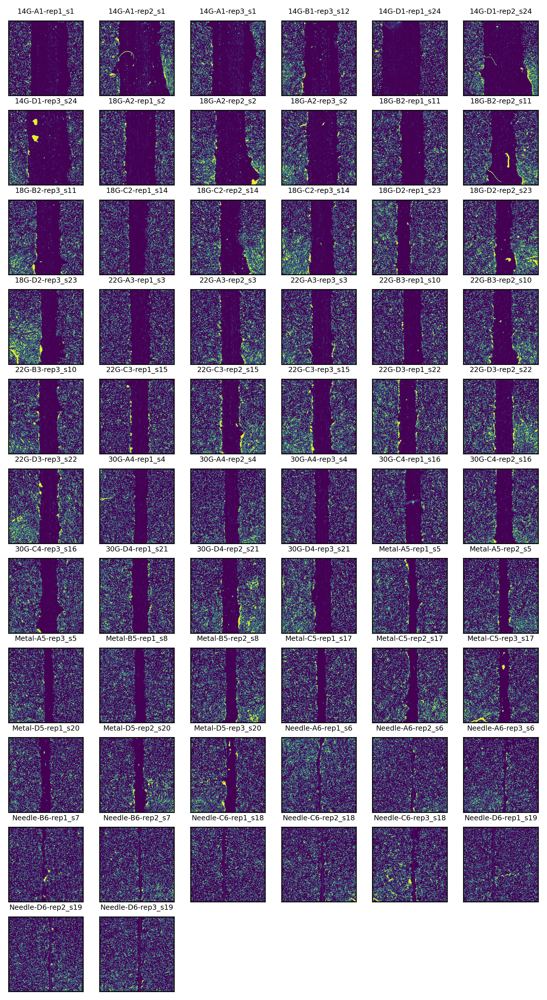

In [9]:
# Check cropped images
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 8, 15
fig, axs = plt.subplots(11, 6)
axs = axs.ravel()

for i, (label, image) in enumerate(cropped_imgs.items()):
    axs[i].imshow(image)
    axs[i].set_title(label, fontsize=6)
    axs[i].set_xticks([])
    axs[i].set_yticks([])

for j in range(len(cropped_imgs), len(axs)):
    axs[j].axis('off')

## Segment cells from images

In [10]:
reload(an)

p = 0.1 # set probability threshold for segmentation

#model = StarDist2D.from_pretrained('2D_versatile_fluo')
model = StarDist2D.from_pretrained('2D_paper_dsb2018')

segments = {}

for i, (label, image) in enumerate(cropped_imgs.items()):
    nucLabels, data = model.predict_instances(normalize(image), prob_thresh=p)
    filtered, dp = an.filter_cell(nucLabels, data, nn=20, q=0.98)
    segments[label] = filtered

print('done')
print(len(segments))

Found model '2D_paper_dsb2018' for 'StarDist2D'.
Loading network weights from 'weights_last.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.417819, nms_thresh=0.5.
done
62


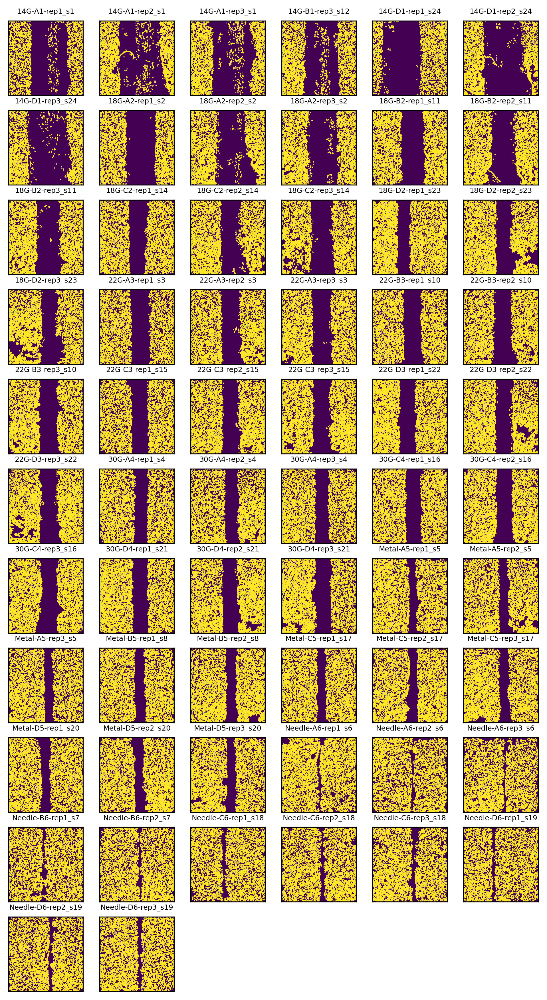

In [11]:
# Check segments
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 8, 15
fig, axs = plt.subplots(11, 6)
axs = axs.ravel()

for i, (label, image) in enumerate(segments.items()):
    axs[i].imshow(image, vmin=0, vmax=1, cmap="viridis")
    axs[i].set_title(label, fontsize=6)
    axs[i].set_xticks([])
    axs[i].set_yticks([])

for j in range(len(segments), len(axs)):
    axs[j].axis('off')

## Get contours and best fit lines for wound edges

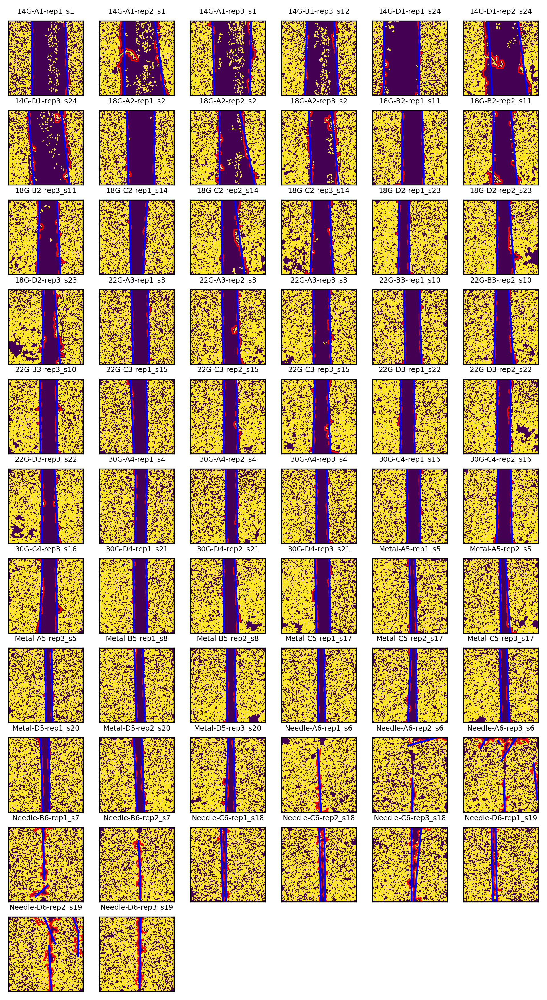

In [14]:
reload(an)

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 8, 15
fig, axs = plt.subplots(11, 6)
axs = axs.ravel()
fig.patch.set_facecolor('white')

foot = skimage.morphology.square

t = 50
q = 40
dilation = [15, 6]

t_needle = 30
q_needle = 50
dilation_needle = [5, 5]

all_data = {}
contour = {}
best_fit_line = {}


for i, (label, image) in enumerate(segments.items()):
    if label.startswith("Needle"):
            wound = an.get_wound_area(image, 
                                      foot, 
                                      t=t_needle, # small object
                                      q=q_needle, # small hole
                                      dilation=dilation_needle)
    else:
        wound = an.get_wound_area(image, 
                                  foot, 
                                  t=t, # small object
                                  q=q, # small hole
                                  dilation=dilation)

    contours = skimage.measure.find_contours(wound)
    best_fit_lines = an.get_lines_of_best_fit(contours)
    
    contour[label] = contours
    best_fit_line[label] = best_fit_lines
    
    axs[i].imshow(image, vmin=0, vmax=1, cmap="viridis")
    axs[i].set_title(label, fontsize=6)
    axs[i].set_xticks([])
    axs[i].set_yticks([])
   

    for j in contours:
        axs[i].plot(j[:, 1], j[:, 0], linewidth=1, color='r')

        x = j[:, 0].reshape(1, -1).T
        y = j[:, 1]

        reg = LinearRegression().fit(x, y)
        y_hat = reg.predict(x)
        y_hat.shape
        axs[i].plot(y_hat, x, color='b')
        axs[i].set_facecolor("white")
        

    all_data[label] = {
        'image' : cropped_imgs[label],
        'segmentations' : segments[label],
        'wound' : wound,
        'contours' : contours,
        'best_fit_lines' : best_fit_lines,
    }
    
    
for k in range(len(segments), len(axs)):
    axs[k].axis('off')

## Remove images with low quality contours

In [15]:
all_data_filtered = all_data.copy()
print(len(all_data_filtered))

removals = ['Needle-D6-rep3_s19', 'Needle-D6-rep2_s19', 'Needle-B6-rep2_s7', 'Needle-B6-rep1_s7', 'Needle-A6-rep1_s6', 'Needle-A6-rep2_s6', 'Needle-A6-rep3_s6',
            '18G-D2-rep1_s23', '18G-D2-rep2_s23', '18G-D2-rep3_s23', '18G-C2-rep1_s14', '18G-C2-rep2_s14', '18G-C2-rep3_s14']

for item in removals:
    del all_data_filtered[item]
    
print(len(all_data_filtered))

62
49


## Create results dataframe

In [16]:
res = []

for image_name, image_data in all_data_filtered.items():

    n_cont = len(image_data['contours'])

    subres = []

    for i in range(n_cont):

        # extract the contour and the corresponding bf line
        cdf = pd.DataFrame(image_data['contours'][i], 
                           columns=['y', 'x'])
        
        cdf['x_centered'] = cdf['x'] - cdf['x'].mean()
        
        cdf['coord_type'] = 'contour'
        
        ldf = pd.DataFrame(image_data['best_fit_lines'][i], 
                           columns=['y', 'x'])
        
        ldf['x_centered'] = ldf['x'] - ldf['x'].mean()
        
        ldf['coord_type'] = 'bf_line'

        # combine them (stacked row-wise, with a column to tease them apart
        tmp = pd.concat([cdf, ldf])
        tmp['contour'] = i
        subres.append(tmp)

    # combine data from all contours
    subres = pd.concat(subres)

    # add information from the image
    subres['image_name'] = image_name
    subres['well'] = image_name.split("_")[0]
    subres['condition'] = image_name.split("-")[0]
    
    # compile across images 
    res.append(subres)   


res = pd.concat(res)
edge_map = {
    0 : 'left',
    1 : 'right',
}

res['wound_edge'] = res['contour'].map(edge_map)

microns = 5.448 # scaling factor; 1 pixel = 5.448 microns

res['x_scaled'] = res['x']*microns

print(f"{res.shape=}")
res.head()

res.shape=(173372, 10)


,y,x,x_centered,coord_type,contour,image_name,well,condition,wound_edge,x_scaled
0,599.0,188.5,-0.160156,contour,0,14G-A1-rep1_s1,14G-A1-rep1,14G,left,1026.948
1,598.0,188.5,-0.160156,contour,0,14G-A1-rep1_s1,14G-A1-rep1,14G,left,1026.948
2,597.0,188.5,-0.160156,contour,0,14G-A1-rep1_s1,14G-A1-rep1,14G,left,1026.948
3,596.0,188.5,-0.160156,contour,0,14G-A1-rep1_s1,14G-A1-rep1,14G,left,1026.948
4,595.0,188.5,-0.160156,contour,0,14G-A1-rep1_s1,14G-A1-rep1,14G,left,1026.948


## Get scratch widths 

In [17]:
res_left = res[(res['wound_edge'] == 'left')]
res_right = res[(res['wound_edge'] == 'right')]

res_widths = pd.merge(res_left, res_right,
                      how='left',
                      left_on=['y', 'image_name', 'condition', 'coord_type'],
                      right_on=['y', 'image_name', 'condition', 'coord_type'])

res_widths['width'] = (res_widths['x_scaled_y'] - res_widths['x_scaled_x'])

res_widths.head()

,y,x_x,x_centered_x,coord_type,contour_x,image_name,well_x,condition,wound_edge_x,x_scaled_x,x_y,x_centered_y,contour_y,well_y,wound_edge_y,x_scaled_y,width
0,599.0,188.5,-0.160156,contour,0,14G-A1-rep1_s1,14G-A1-rep1,14G,left,1026.948,459.5,-7.160147,1.0,14G-A1-rep1,right,2503.356,1476.408
1,598.0,188.5,-0.160156,contour,0,14G-A1-rep1_s1,14G-A1-rep1,14G,left,1026.948,459.5,-7.160147,1.0,14G-A1-rep1,right,2503.356,1476.408
2,597.0,188.5,-0.160156,contour,0,14G-A1-rep1_s1,14G-A1-rep1,14G,left,1026.948,459.5,-7.160147,1.0,14G-A1-rep1,right,2503.356,1476.408
3,596.0,188.5,-0.160156,contour,0,14G-A1-rep1_s1,14G-A1-rep1,14G,left,1026.948,459.5,-7.160147,1.0,14G-A1-rep1,right,2503.356,1476.408
4,595.0,188.5,-0.160156,contour,0,14G-A1-rep1_s1,14G-A1-rep1,14G,left,1026.948,459.5,-7.160147,1.0,14G-A1-rep1,right,2503.356,1476.408


3525441721.py (26): set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.


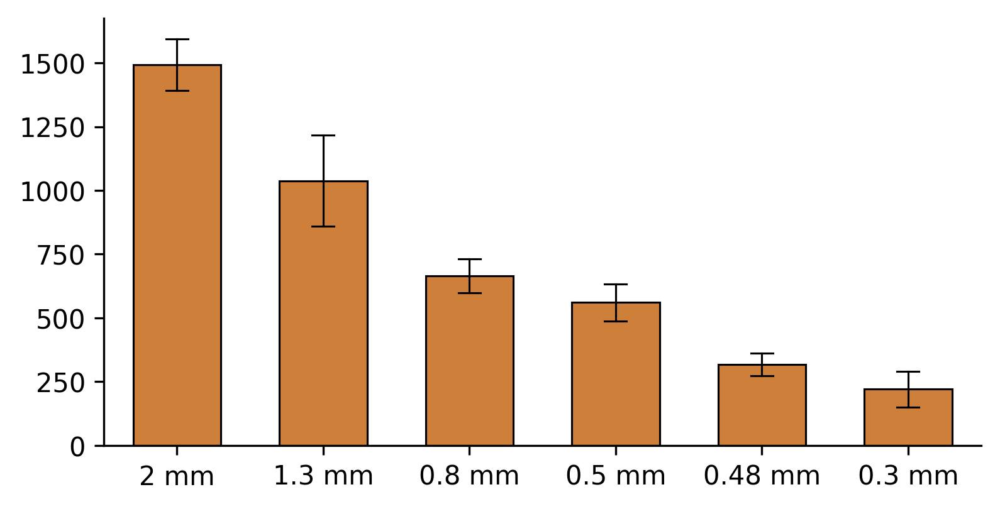

In [18]:
widths_bfline = res_widths[res_widths['coord_type'] == 'bf_line']
widths_contour = res_widths[res_widths['coord_type'] == 'contour']

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 6,3
fig, ax = plt.subplots()

err_kws = {'color' : 'k', 'linewidth' : 0.75}

order_condition = ['14G', '18G', '22G', '30G', 'Metal', 'Needle']

sns.barplot(data=widths_bfline,
            x='condition',
            y='width',
            errorbar="sd",
            color='#E67E22',
            capsize=0.15,
            linewidth=0.75,
            edgecolor='k',
            err_kws = err_kws,
            order=order_condition,
            width=0.6
           )

plt.legend([], [], frameon=False)
ax.set_xticklabels(['2 mm', '1.3 mm', '0.8 mm', '0.5 mm', '0.48 mm', '0.3 mm'])
plt.xlabel("")
plt.ylabel("")
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

sns.despine()

In [19]:
# Take same number of width measurments for calculating avg width per scratch

res_rep = widths_bfline[['y', 'image_name', 'condition', 'width']]

replicate_sizes = res_rep.groupby('image_name')['width'].count() # get number of width measurements per scratch

min_size = replicate_sizes.min() # find min number of width measurements for any scratch

sampled_res = res_rep.groupby('image_name').apply(lambda x: x.sample(n=min_size, random_state=42)).reset_index(drop=True)

avg_width_per_scratch = sampled_res.groupby('image_name')['width'].mean().reset_index()

avg_width_per_scratch['condition'] = avg_width_per_scratch['image_name'].str[:3]

avg_width_per_scratch.head()

3803061037.py (9): DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.


,image_name,width,condition
0,14G-A1-rep1_s1,1514.662597,14G
1,14G-A1-rep2_s1,1530.871035,14G
2,14G-A1-rep3_s1,1625.048533,14G
3,14G-B1-rep3_s12,1321.108125,14G
4,14G-D1-rep1_s24,1541.042630,14G


In [20]:
avg_width_per_scratch.groupby('condition')['width'].describe()

,count,mean,std,min,25%,50%,75%,max
condition,,,,,,,,
14G,7.0,1494.290787,95.169372,1321.108125,1463.651295,1514.662597,1535.956832,1625.048533
18G,6.0,1037.979859,162.829908,898.447030,906.025225,987.298349,1135.960378,1290.386852
22G,12.0,663.232528,58.016593,567.029898,625.473515,677.037045,716.953797,729.325320
30G,9.0,562.599453,70.298628,476.836990,490.611606,573.816131,607.306640,682.612332
Met,11.0,318.425138,32.635331,258.468301,294.616340,324.592437,337.105314,365.874486
Nee,4.0,219.129004,55.462735,177.654924,189.057216,199.151155,229.222943,300.558782


3836212822.py (23): set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.


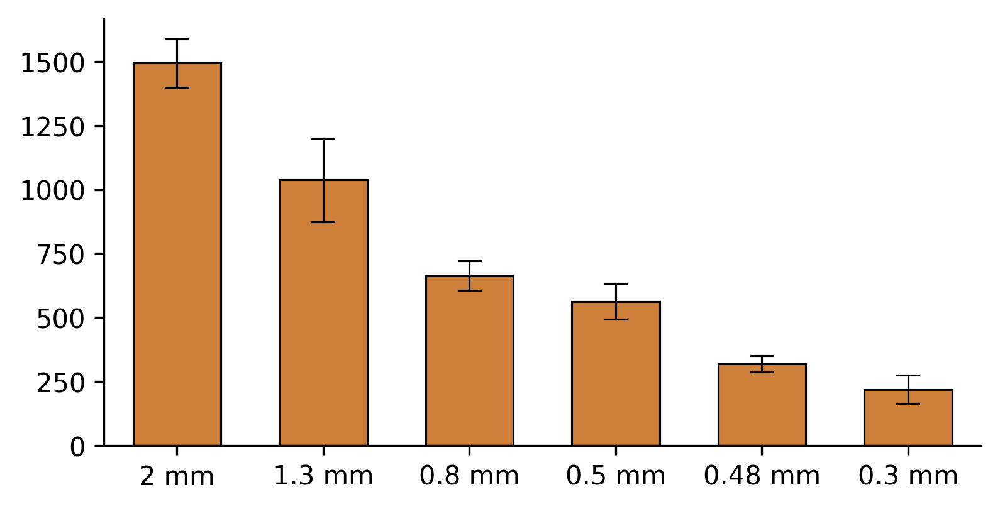

In [21]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 6,3
fig, ax = plt.subplots()

err_kws = {'color' : 'k', 'linewidth' : 0.75}

order_condition = ['14G', '18G', '22G', '30G', 'Met', 'Nee']

sns.barplot(data=avg_width_per_scratch,
            x='condition',
            y='width',
            errorbar="sd",
            color='#E67E22',
            capsize=0.15,
            linewidth=0.75,
            edgecolor='k',
            err_kws = err_kws,
            order=order_condition,
            width=0.6,
           )

plt.legend([], [], frameon=False)
ax.set_xticklabels(['2 mm', '1.3 mm', '0.8 mm', '0.5 mm', '0.48 mm', '0.3 mm'])
plt.xlabel("")
plt.ylabel("")
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

sns.despine()